In [1]:
import os
import sys
import time
import torch
import torch.nn
import argparse
from PIL import Image
from tensorboardX import SummaryWriter
import numpy as np
from validate import validate
from data import create_dataloader
from networks.trainer import Trainer
from options.train_options import TrainOptions
from options.test_options import TestOptions
from util import Logger


/home/user/mambaforge/envs/bmsn/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import random


def seed_torch(seed=1029):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed) # if you are using multi-GPU.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.enabled = False


In [3]:
def get_val_opt():
    val_opt = TrainOptions().parse(print_options=True)
    val_opt.dataroot = '{}/{}/'.format(val_opt.dataroot, val_opt.val_split)
    val_opt.isTrain = False
    val_opt.no_resize = False
    val_opt.no_crop = False
    val_opt.serial_batches = True

    return val_opt

In [4]:
from bitmind.real_fake_dataset import RealFakeDataset
from bitmind.real_image_dataset import RealImageDataset
#from bitmind.random_image_generator import RandomImageGenerator
import torchvision.transforms as transforms
import torch

train_real_image_dataset = RealImageDataset(huggingface_dataset_names=['saitsharipov/CelebA-HQ'], splits=['train'], create_splits=True)
val_real_image_dataset = RealImageDataset(huggingface_dataset_names=['saitsharipov/CelebA-HQ'], splits=['validation'], create_splits=True)
test_real_image_dataset = RealImageDataset(huggingface_dataset_names=['saitsharipov/CelebA-HQ'], splits=['test'], create_splits=True)

train_fake_image_dataset = RealImageDataset(huggingface_dataset_names=["bitmind/face-swap"], splits=['train'])
val_fake_image_dataset = RealImageDataset(huggingface_dataset_names=["bitmind/face-swap"], splits=['validation'])
test_fake_image_dataset = RealImageDataset(huggingface_dataset_names=["bitmind/face-swap"], splits=['test'])


/home/user/mambaforge/envs/bmsn/lib/python3.10/site-packages/eth_utils/network.py:44: UserWarning: Network 345 with name 'Yooldo Verse Mainnet' does not have a valid ChainId. eth-typing should be updated with the latest networks.
  warnings.warn(
/home/user/mambaforge/envs/bmsn/lib/python3.10/site-packages/eth_utils/network.py:44: UserWarning: Network 12611 with name 'Astar zkEVM' does not have a valid ChainId. eth-typing should be updated with the latest networks.
  warnings.warn(


In [5]:
MEAN = {
    "imagenet":[0.485, 0.456, 0.406],
    "clip":[0.48145466, 0.4578275, 0.40821073]
}

STD = {
    "imagenet":[0.229, 0.224, 0.225],
    "clip":[0.26862954, 0.26130258, 0.27577711]
}

def CenterCrop():
    def fn(img):
        m = min(img.size)
        return transforms.CenterCrop(m)(img)
    return fn

transform = transforms.Compose([
    CenterCrop(),
    #transforms.CenterCrop(224),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Lambda(lambda t: t.expand(3, -1, -1) if t.shape[0] == 1 else t),
    #transforms.Lambda(lambda t: t.float() / 255.),

    #transforms.Normalize( mean=MEAN['imagenet'], std=STD['imagenet'] ),
])

train_dataset = RealFakeDataset(real_image_dataset=train_real_image_dataset, fake_image_dataset=train_fake_image_dataset, transforms=transform)
val_dataset = RealFakeDataset(real_image_dataset=val_real_image_dataset, fake_image_dataset=val_fake_image_dataset, transforms=transform)
test_dataset = RealFakeDataset(real_image_dataset=test_real_image_dataset, fake_image_dataset=test_fake_image_dataset, transforms=transform)


In [6]:
from argparse import ArgumentParser
opt = TrainOptions().parse()
seed_torch(100)

#Logger(os.path.join(opt.checkpoints_dir, opt.name, 'log.log'))
val_opt = get_val_opt()
Testopt = TestOptions().parse(print_options=False)

train_writer = SummaryWriter(os.path.join(opt.checkpoints_dir, opt.name, "train"))
val_writer = SummaryWriter(os.path.join(opt.checkpoints_dir, opt.name, "val"))
opt.earlystop_epoch = 5

----------------- Options ---------------
                     arch: res50                         
               batch_size: 64                            
                    beta1: 0.9                           
                blur_prob: 0                             
                 blur_sig: 0.5                           
          checkpoints_dir: ./checkpoints                 
                class_bal: False                         
                  classes:                               
           continue_train: False                         
                 cropSize: 224                           
                 data_aug: False                         
                 dataroot: ./dataset/                    
                delr_freq: 20                            
          earlystop_epoch: 15                            
                    epoch: latest                        
              epoch_count: 1                             
                  gpu_ids: 0  

In [7]:

model = Trainer(opt)


In [8]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=0, collate_fn=lambda d: tuple(d))
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=0, collate_fn=lambda d: tuple(d))
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=0, collate_fn=lambda d: tuple(d))


In [9]:
train = False

if train:
    best_val_acc = 0
    
    model.train()
    print(f'cwd: {os.getcwd()}')
    for epoch in range(opt.niter):
        epoch_start_time = time.time()
        iter_data_time = time.time()
        epoch_iter = 0
    
        for i, data in enumerate(train_loader):
            model.total_steps += 1
            epoch_iter += opt.batch_size
    
            model.set_input(data)
            model.optimize_parameters()
    
            print(time.strftime("%Y_%m_%d_%H_%M_%S", time.localtime()), "Train loss: {} at step: {} lr {}".format(model.loss, model.total_steps, model.lr))
        
            if model.total_steps % opt.loss_freq == 0:
                train_writer.add_scalar('loss', model.loss, model.total_steps)
            
        if epoch % opt.delr_freq == 0 and epoch != 0:
            print(time.strftime("%Y_%m_%d_%H_%M_%S", time.localtime()), 'changing lr at the end of epoch %d, iters %d' %
                  (epoch, model.total_steps))
            model.adjust_learning_rate()
    
        # Validation
        model.eval()
        acc, ap = validate(model.model, val_loader)[:2]
        val_writer.add_scalar('accuracy', acc, model.total_steps)
        val_writer.add_scalar('ap', ap, model.total_steps)
        print("(Val @ epoch {}) acc: {}; ap: {}".format(epoch, acc, ap))
        if acc > best_val_acc:
            model.save_networks('best')
            best_val_acc = acc
        #testmodel()
        model.train()
    
    model.eval()
    acc, ap = validate(model.model, test_loader)[:2]
    print("(Test) acc: {}; ap: {}".format(acc, ap))
    model.save_networks('last')


In [10]:
load_model = True
if load_model:
    model = Trainer(opt)
    
    #weight_path = '/home/user/bitmind-subnet/npr/checkpoints/experiment_name2024_05_27_22_56_52/model_epoch_best.pth'
    weight_path = '/home/user/bitmind-subnet/npr/checkpoints/experiment_name2024_05_30_17_23_40/model_epoch_best.pth'
    model.model.load_state_dict(torch.load(weight_path, map_location='cpu'))
    model.model.eval()

In [11]:
model.eval()
acc, ap, r_acc, f_acc, y_true, y_pred = validate(model.model, test_loader)
print("(Test) acc: {}; ap: {}".format(acc, ap))

(Test) acc: 0.9217821782178218; ap: 0.9802636140556338


In [12]:
y_pred

array([9.99999762e-01, 8.37687962e-03, 6.24552486e-05, ...,
       4.51303960e-04, 9.99999762e-01, 2.99888896e-03])

id: 19; Label: 0.0; Prediction: 0.9737840294837952


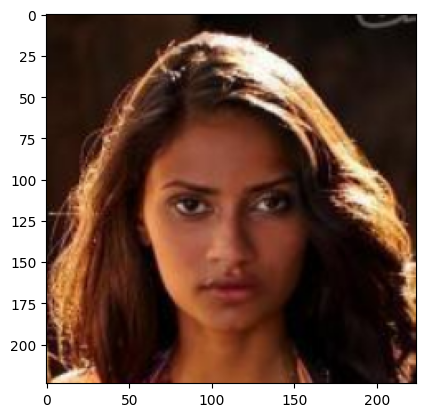

id: 25; Label: 0.0; Prediction: 0.9993504881858826


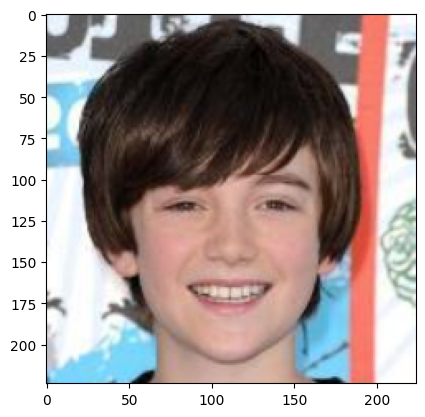

id: 48; Label: 0.0; Prediction: 0.520703136920929


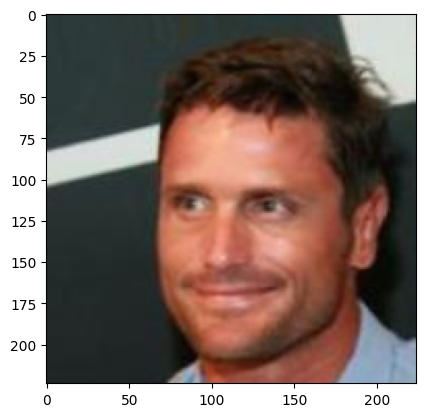

id: swap_1687_to_celeb.jpg; Label: 1.0; Prediction: 8.448916233305681e-09


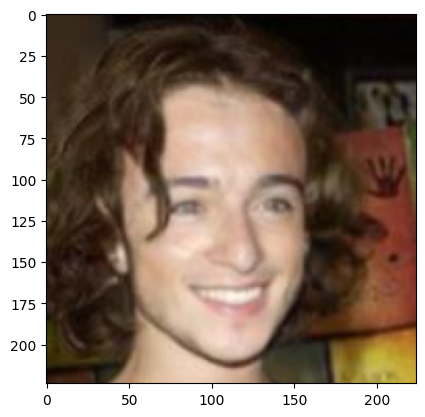

id: 79; Label: 0.0; Prediction: 0.80685955286026


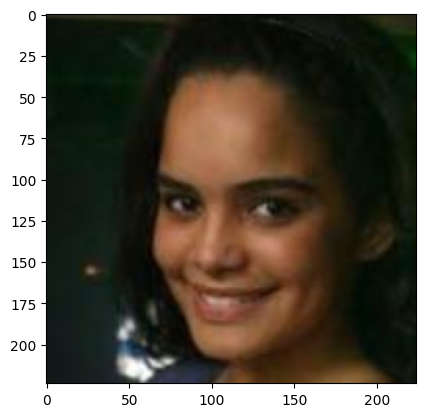

id: hq_swap_576.jpg; Label: 1.0; Prediction: 0.3080810308456421


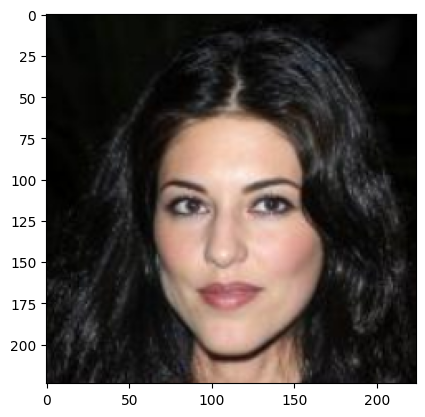

id: swap_483_to_celeb.jpg; Label: 1.0; Prediction: 0.18399086594581604


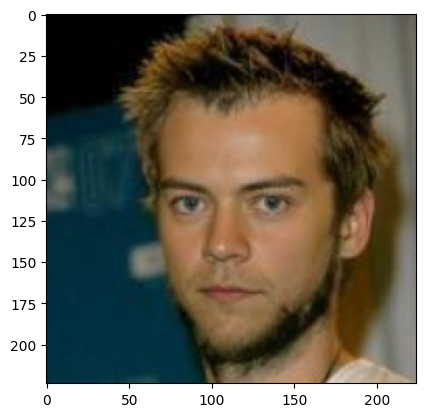

id: 123; Label: 0.0; Prediction: 0.8655600547790527


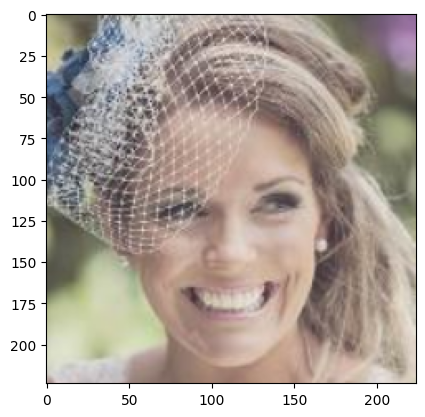

id: swap_4599_to_celeb.jpg; Label: 1.0; Prediction: 0.28208839893341064


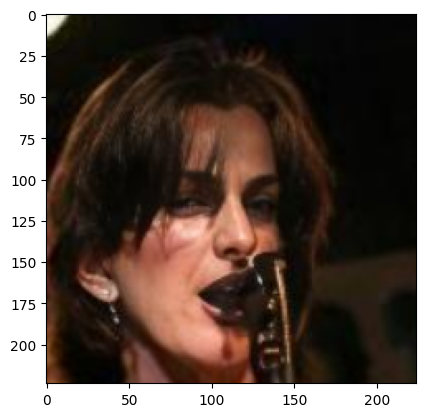

id: swap_1478_to_celeb.jpg; Label: 1.0; Prediction: 0.41493335366249084


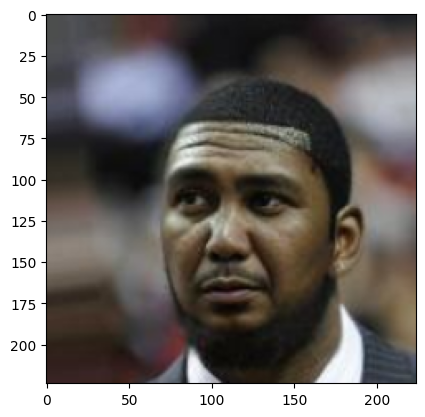

id: 172; Label: 0.0; Prediction: 0.9744016528129578


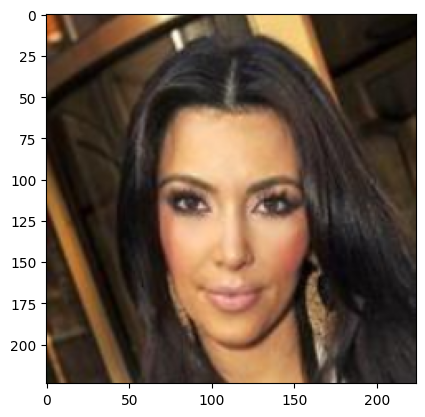

id: 182; Label: 0.0; Prediction: 0.9921784400939941


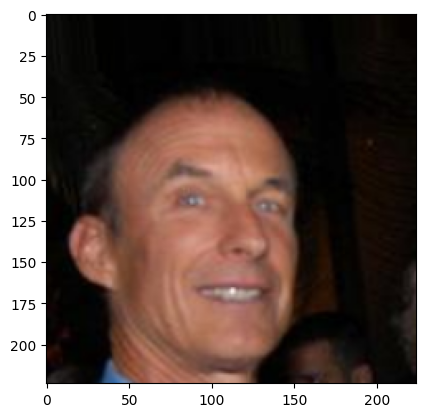

id: swap_3500_to_celeb.jpg; Label: 1.0; Prediction: 0.0005035311332903802


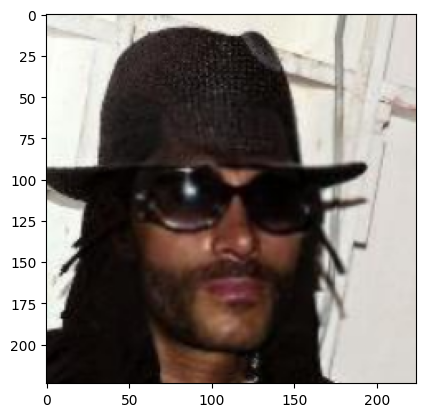

id: 202; Label: 0.0; Prediction: 0.9613000750541687


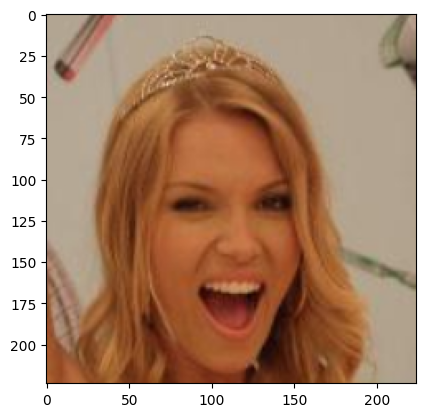

id: hq_swap_3416.jpg; Label: 1.0; Prediction: 0.011833555996418


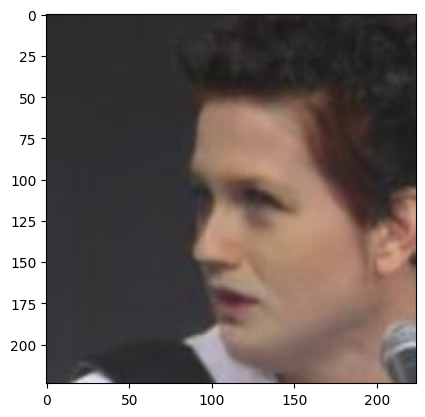

id: hq_swap_4314.jpg; Label: 1.0; Prediction: 0.09773776680231094


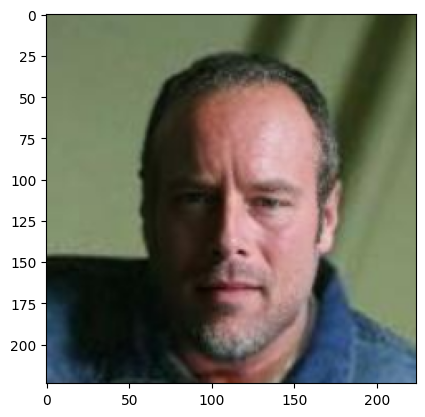

id: swap_213_to_celeb.jpg; Label: 1.0; Prediction: 0.006462895777076483


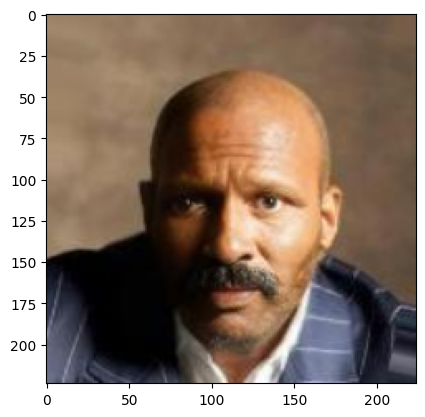

id: swap_5535_to_celeb.jpg; Label: 1.0; Prediction: 0.020352408289909363


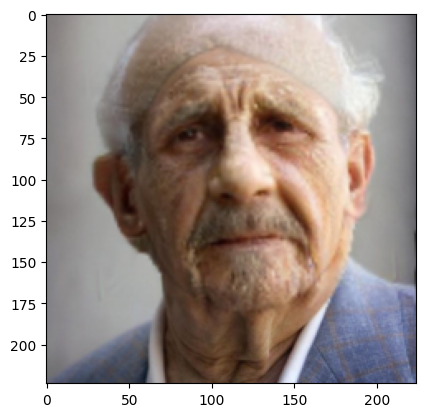

id: 242; Label: 0.0; Prediction: 0.691434919834137


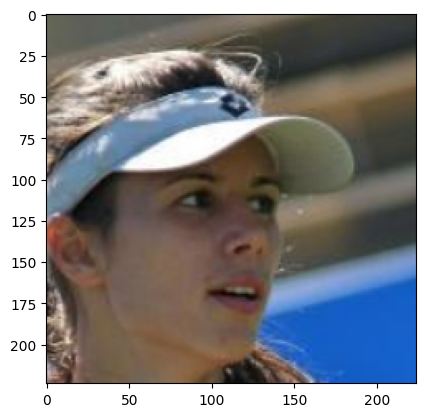

id: swap_95_to_celeb.jpg; Label: 1.0; Prediction: 0.04235305264592171


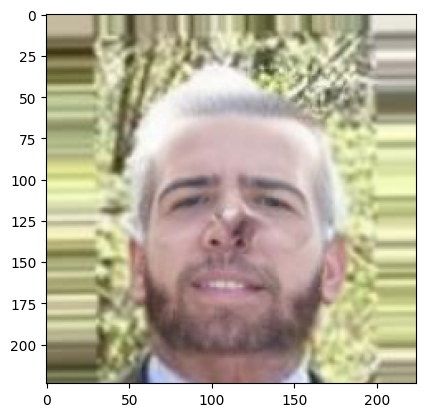

id: 272; Label: 0.0; Prediction: 0.9898596405982971


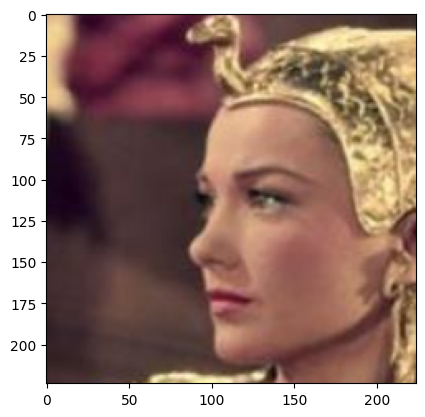

id: hq_swap_2817.jpg; Label: 1.0; Prediction: 0.07745088636875153


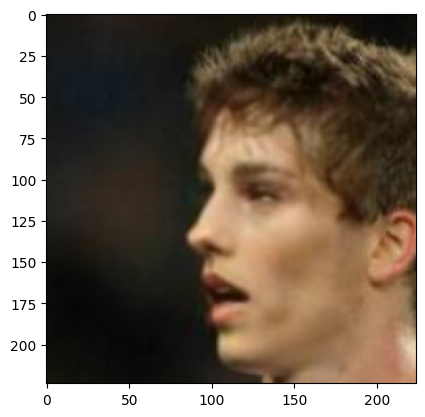

id: hq_swap_114.jpg; Label: 1.0; Prediction: 0.0004775002598762512


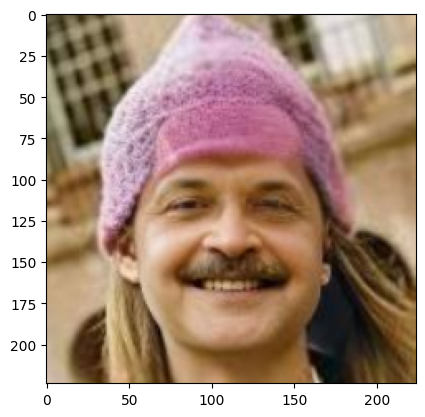

id: 281; Label: 0.0; Prediction: 0.9529725909233093


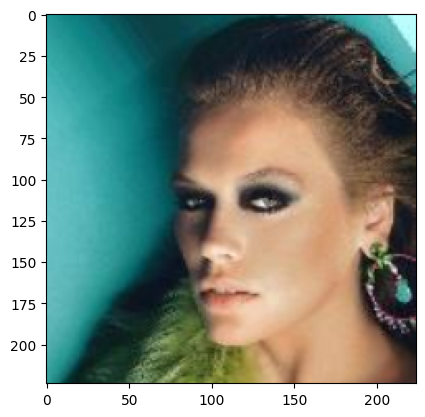

id: hq_swap_4947.jpg; Label: 1.0; Prediction: 1.9347160105098737e-06


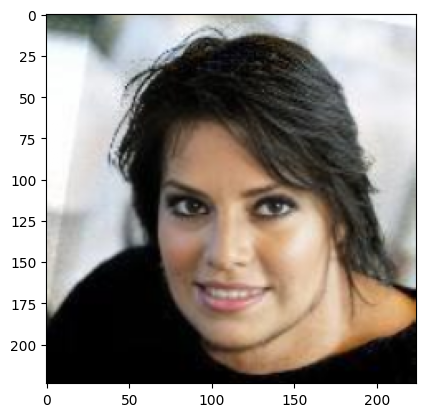

id: 298; Label: 0.0; Prediction: 0.9951021671295166


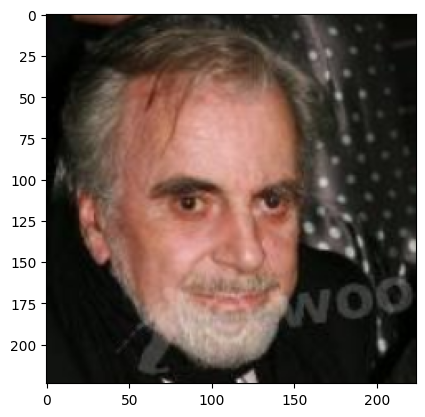

id: hq_swap_4585.jpg; Label: 1.0; Prediction: 0.0004718083655461669


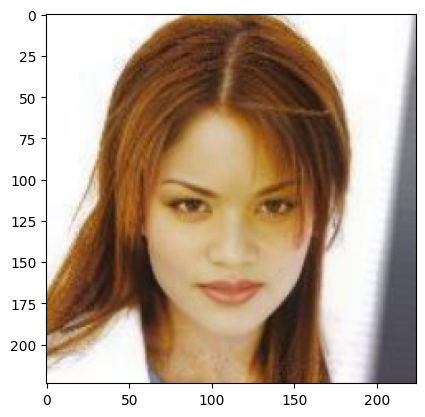

id: swap_3976_to_celeb.jpg; Label: 1.0; Prediction: 0.1655171662569046


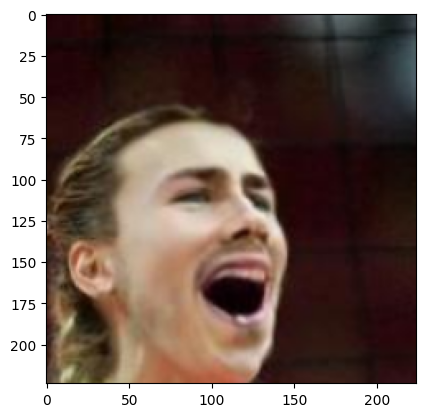

id: 352; Label: 0.0; Prediction: 0.9928192496299744


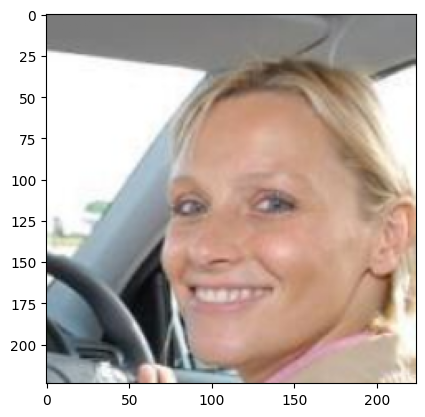

id: hq_swap_1763.jpg; Label: 1.0; Prediction: 0.4576137959957123


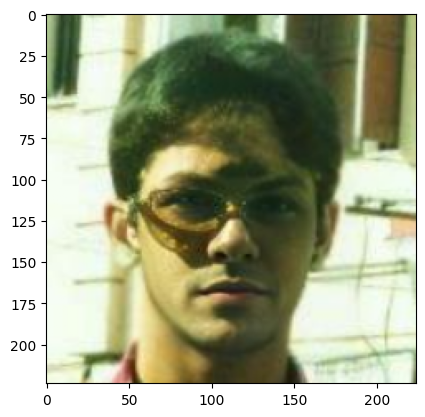

id: 369; Label: 0.0; Prediction: 0.6865901947021484


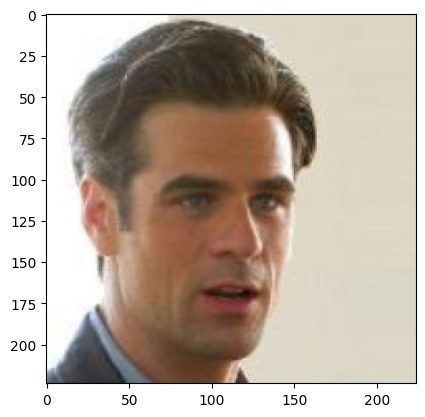

id: hq_swap_3624.jpg; Label: 1.0; Prediction: 0.0008025148417800665


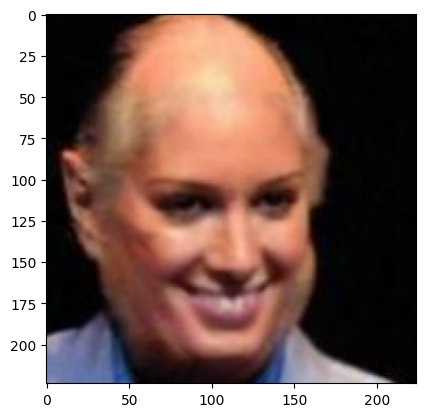

id: hq_swap_5214.jpg; Label: 1.0; Prediction: 0.1011890396475792


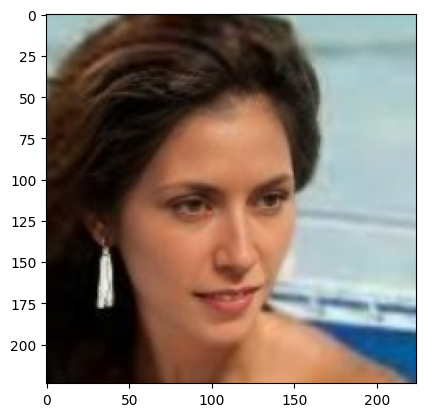

id: hq_swap_1950.jpg; Label: 1.0; Prediction: 0.0037423595786094666


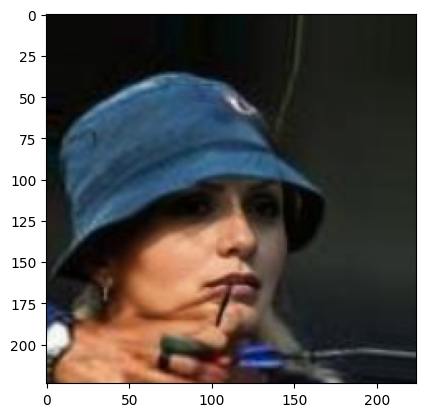

id: hq_swap_4591.jpg; Label: 1.0; Prediction: 0.2538183629512787


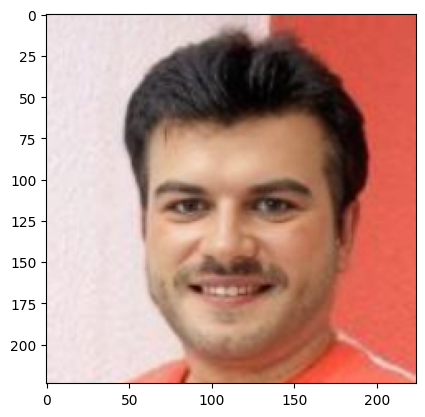

id: hq_swap_2295.jpg; Label: 1.0; Prediction: 0.001190747949294746


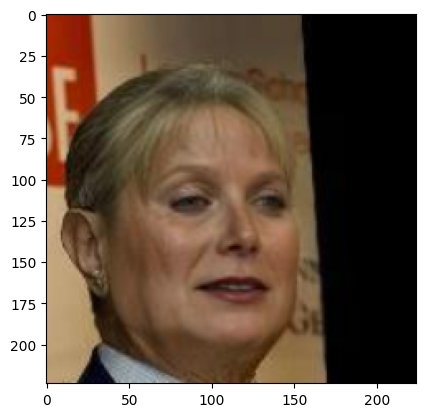

id: swap_2002_to_celeb.jpg; Label: 1.0; Prediction: 0.0477970689535141


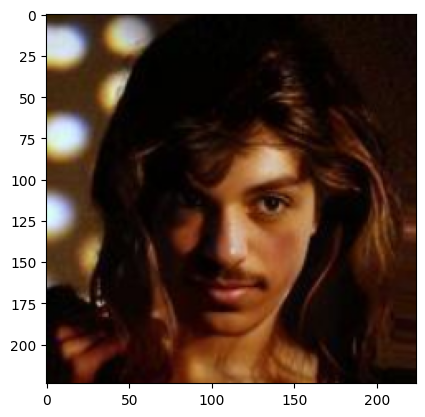

id: 483; Label: 0.0; Prediction: 0.9759282469749451


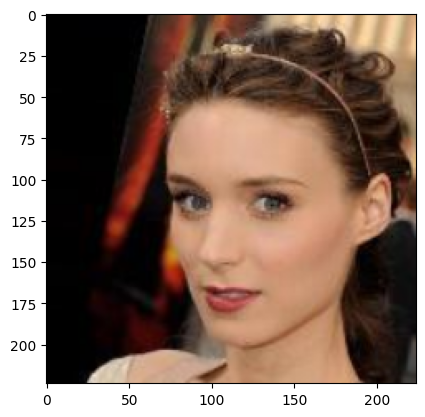

id: hq_swap_3566.jpg; Label: 1.0; Prediction: 0.00383710116147995


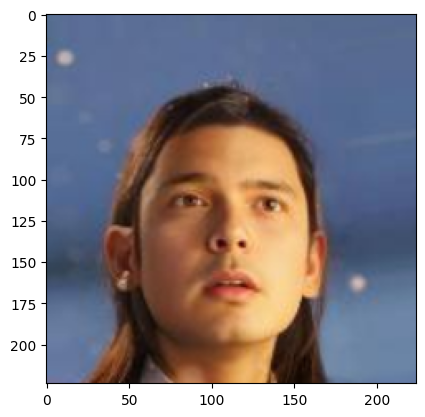

id: 513; Label: 0.0; Prediction: 0.9718786478042603


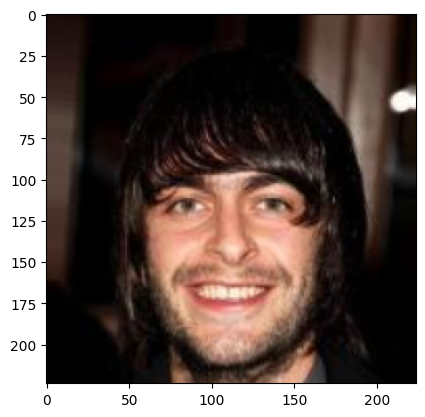

id: 527; Label: 0.0; Prediction: 0.9668024182319641


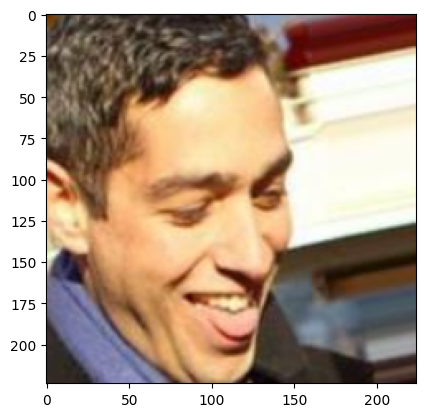

id: 544; Label: 0.0; Prediction: 0.9441000819206238


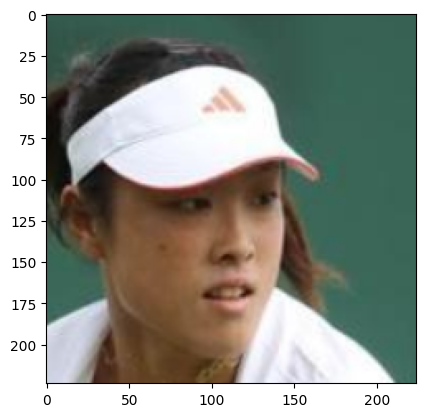

id: hq_swap_4989.jpg; Label: 1.0; Prediction: 0.30816468596458435


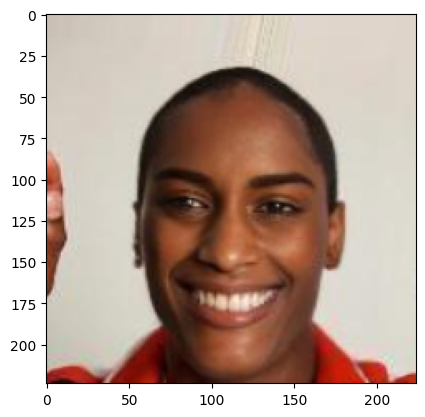

id: 600; Label: 0.0; Prediction: 0.9736904501914978


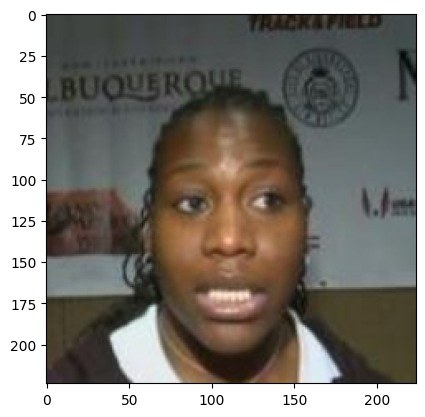

id: 609; Label: 0.0; Prediction: 0.7755743861198425


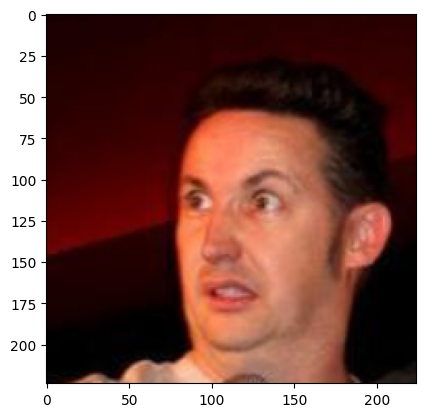

id: 614; Label: 0.0; Prediction: 0.579155683517456


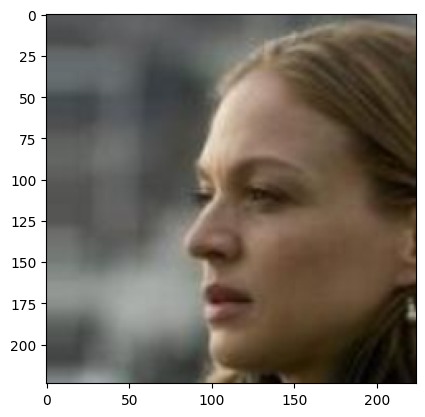

id: swap_2785_to_celeb.jpg; Label: 1.0; Prediction: 0.0022564532700926065


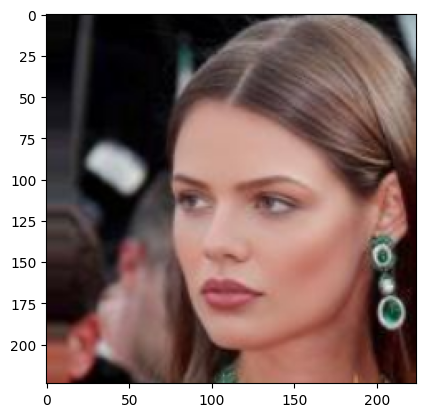

id: hq_swap_5659.jpg; Label: 1.0; Prediction: 0.4921090006828308


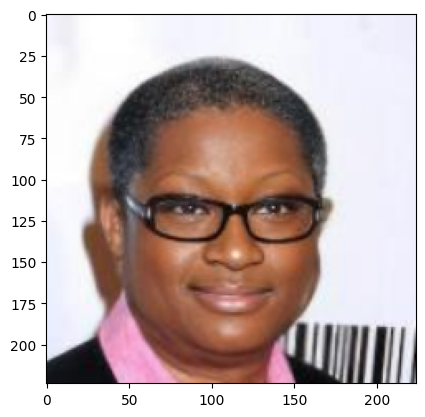

id: hq_swap_5544.jpg; Label: 1.0; Prediction: 0.07684781402349472


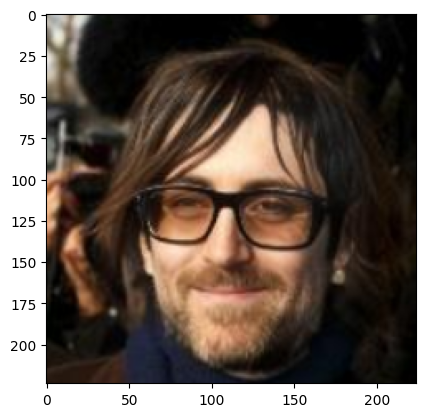

id: swap_2087_to_celeb.jpg; Label: 1.0; Prediction: 0.2432464063167572


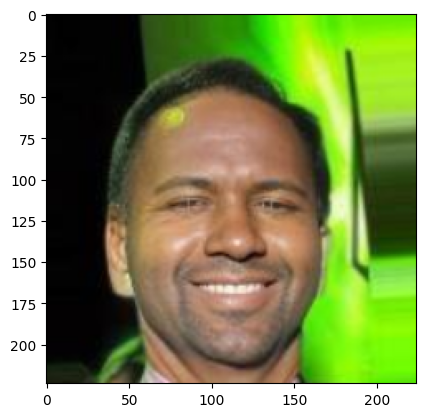

id: 682; Label: 0.0; Prediction: 0.6399113535881042


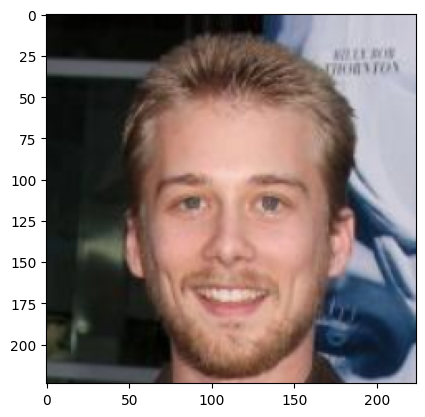

id: swap_2227_to_celeb.jpg; Label: 1.0; Prediction: 0.39898914098739624


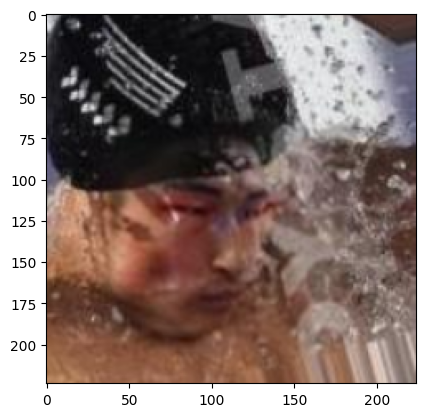

id: hq_swap_4932.jpg; Label: 1.0; Prediction: 0.001403588568791747


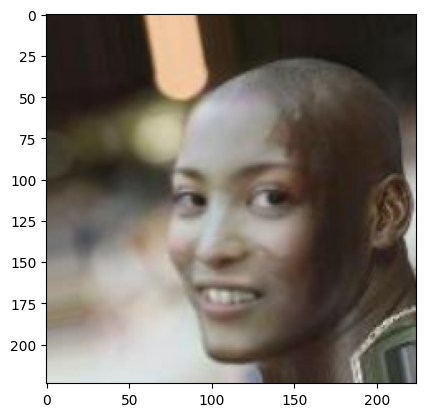

id: swap_1135_to_celeb.jpg; Label: 1.0; Prediction: 0.025534851476550102


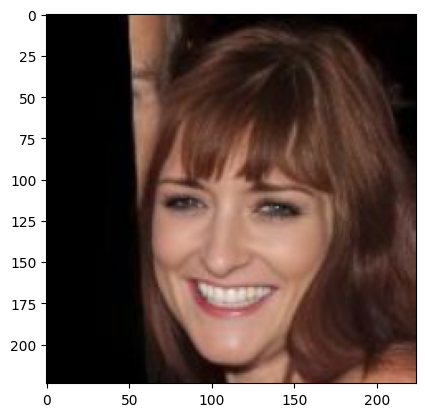

id: 748; Label: 0.0; Prediction: 0.9833146333694458


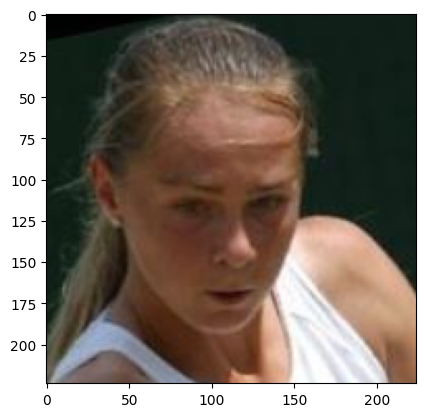

id: 759; Label: 0.0; Prediction: 0.9785207509994507


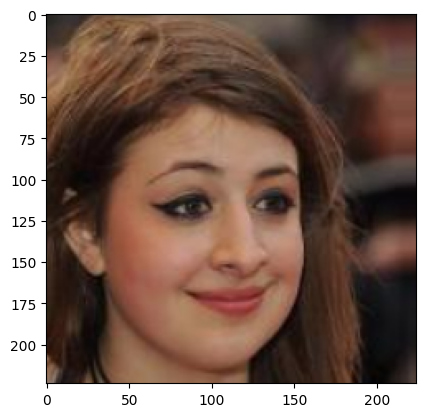

id: hq_swap_1077.jpg; Label: 1.0; Prediction: 0.06619329005479813


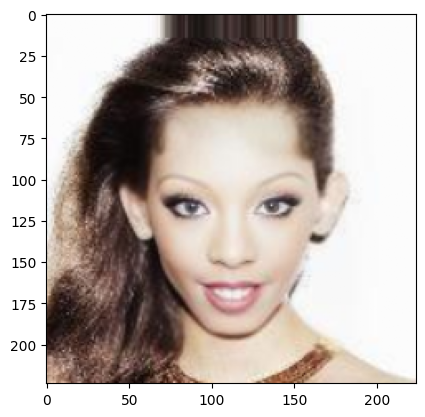

id: 767; Label: 0.0; Prediction: 0.9175915122032166


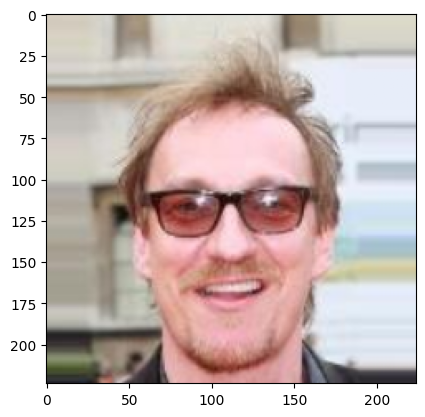

id: 781; Label: 0.0; Prediction: 0.9535044431686401


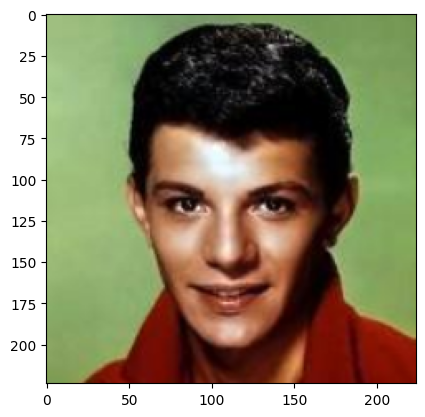

id: 786; Label: 0.0; Prediction: 0.8575536608695984


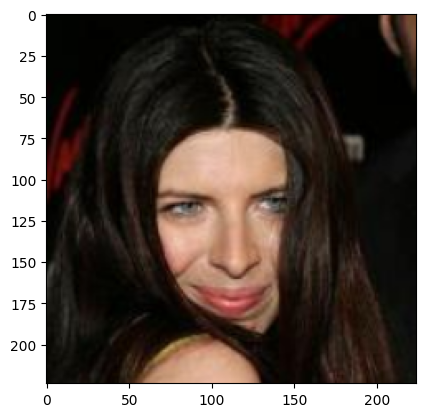

id: swap_3300_to_celeb.jpg; Label: 1.0; Prediction: 0.012534327805042267


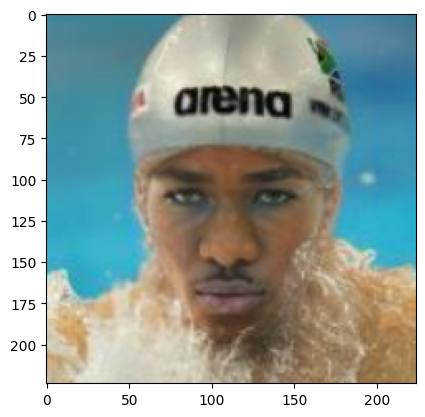

id: swap_578_to_celeb.jpg; Label: 1.0; Prediction: 0.028430888429284096


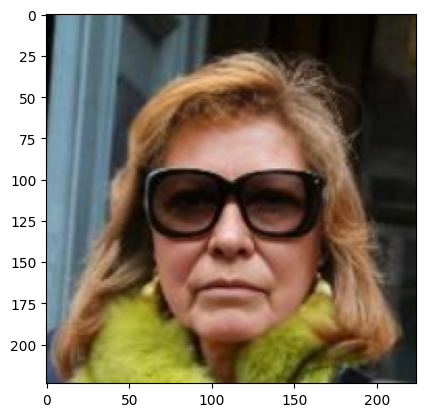

id: hq_swap_1555.jpg; Label: 1.0; Prediction: 0.0002994858368765563


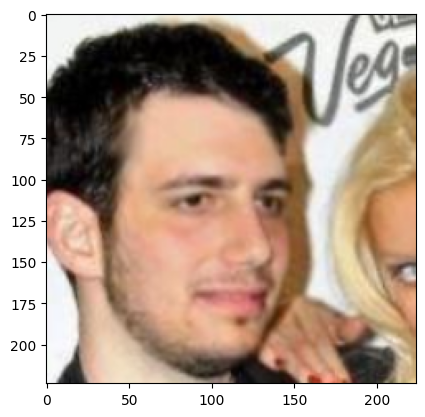

id: 853; Label: 0.0; Prediction: 0.997787594795227


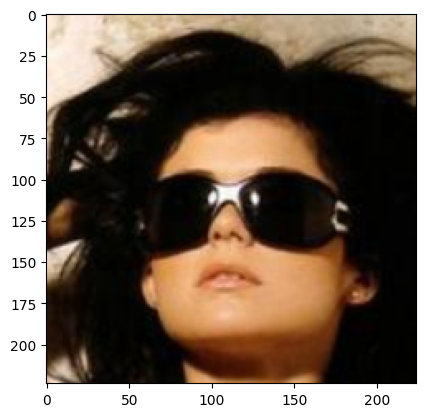

id: hq_swap_2732.jpg; Label: 1.0; Prediction: 0.2307274043560028


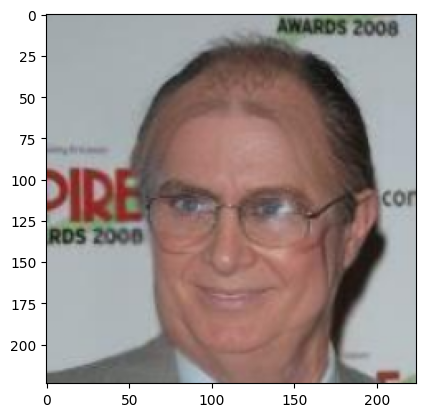

id: hq_swap_3832.jpg; Label: 1.0; Prediction: 0.0009210346615873277


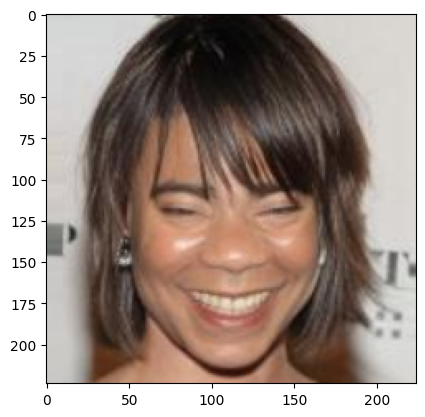

id: 872; Label: 0.0; Prediction: 0.9173403978347778


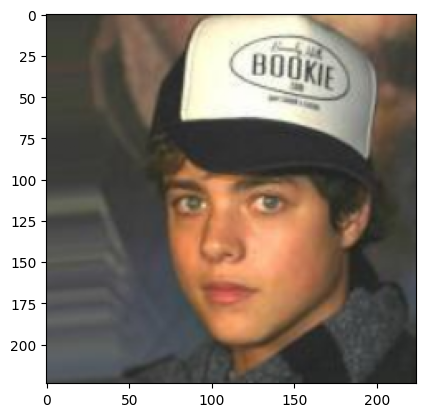

id: swap_4540_to_celeb.jpg; Label: 1.0; Prediction: 0.4807789623737335


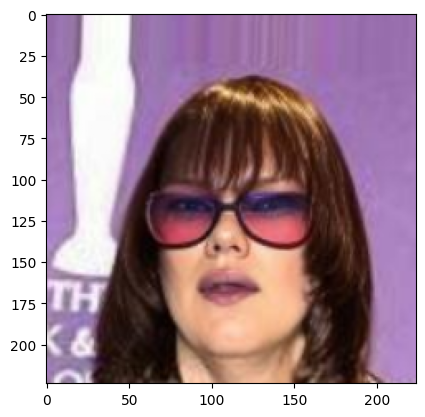

id: 914; Label: 0.0; Prediction: 0.9896402955055237


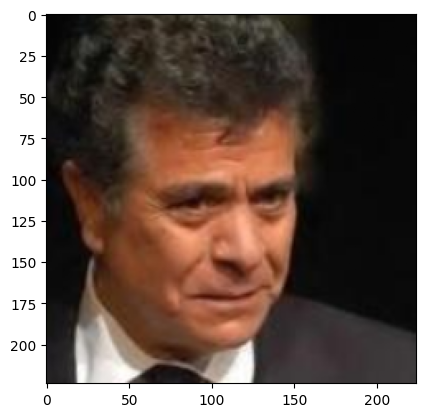

id: swap_4106_to_celeb.jpg; Label: 1.0; Prediction: 0.032017841935157776


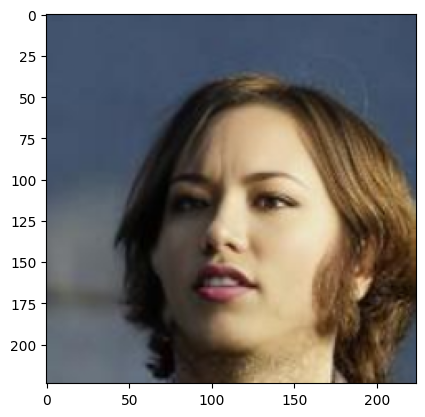

id: 937; Label: 0.0; Prediction: 0.940764307975769


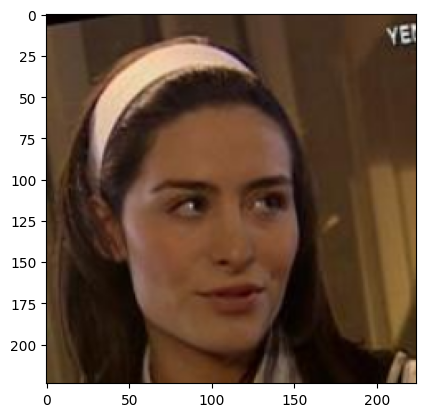

id: hq_swap_72.jpg; Label: 1.0; Prediction: 0.4831188917160034


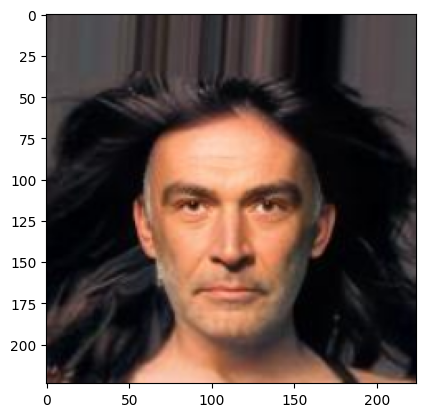

id: swap_2724_to_celeb.jpg; Label: 1.0; Prediction: 0.029090331867337227


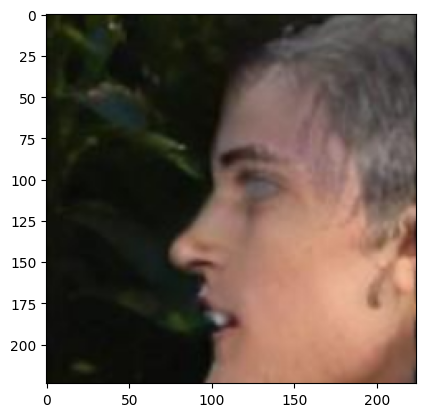

id: hq_swap_4919.jpg; Label: 1.0; Prediction: 0.2121158391237259


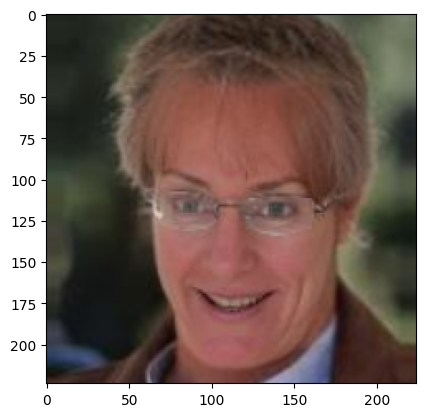

id: swap_2347_to_celeb.jpg; Label: 1.0; Prediction: 0.0015658828197047114


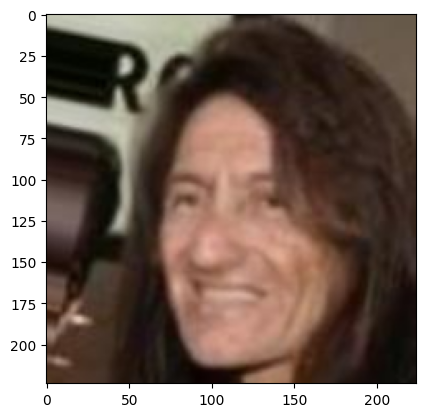

id: 986; Label: 0.0; Prediction: 0.5263773798942566


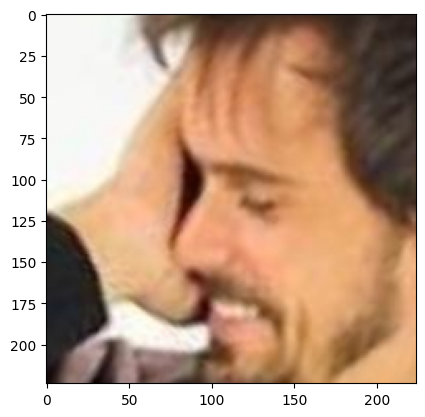

id: swap_1074_to_celeb.jpg; Label: 1.0; Prediction: 5.2408711781026796e-05


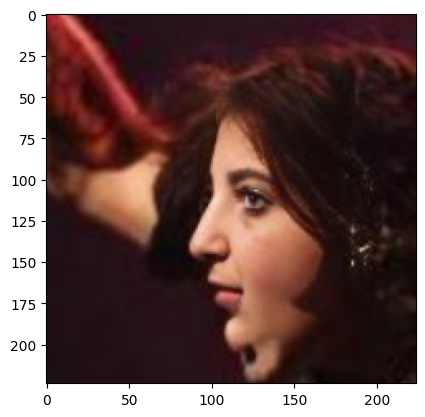

id: hq_swap_1418.jpg; Label: 1.0; Prediction: 7.758810534141958e-05


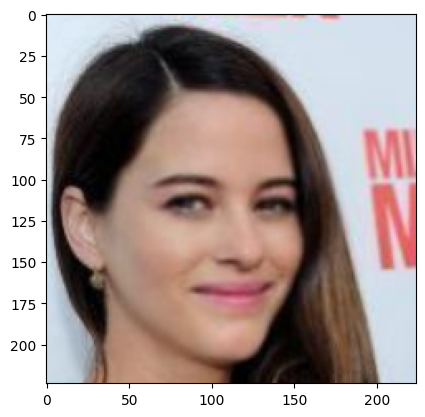

id: hq_swap_754.jpg; Label: 1.0; Prediction: 0.07556593418121338


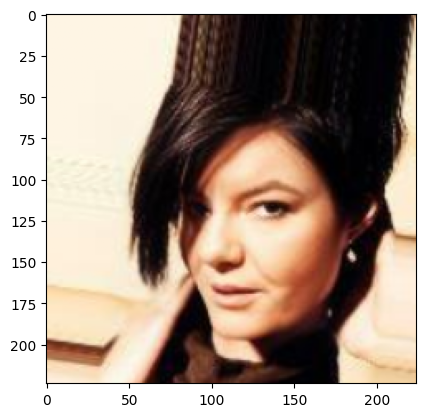

In [18]:
import matplotlib.pyplot as plt 

pred_idx = 0
n_total = 0
fp = 0
tp = 0
fn = 0
tn = 0
for batch in test_loader:
    keep_idx = [i for i, b in enumerate(batch) if b[0].shape[0] == batch[0][0].shape[0]]
    images = [b[0] for i, b in enumerate(batch) if i in keep_idx]
    for i, (image, y, y_hat) in enumerate(zip(images, y_true[pred_idx: pred_idx+len(images)], y_pred[pred_idx: pred_idx+len(images)])):
        if i not in keep_idx:
            continue

        y_hat_ = np.round(y_hat)
        if y_hat_ == 1 and y == 1:
            tp += 1
        elif y_hat_ == 0 and y == 1:
            fn += 1
        elif y_hat_ == 1 and y == 0:
            fp += 1
        else:
            tn += 1

        if y_hat_ != y:
            
            plt.imshow(np.transpose(image, (1, 2, 0)))
            img_id = test_loader.dataset._image_ids[pred_idx + i]
            print(f"id: {img_id}; Label: {y}; Prediction: {y_hat}")
            plt.show()
    pred_idx += len(images)


In [14]:
tp, fp, tn, fn

(458, 32, 473, 47)

In [15]:
def compute_metrics(TP, FP, TN, FN):
    precision = TP / (TP + FP) if (TP + FP) != 0 else 0
    recall = TP / (TP + FN) if (TP + FN) != 0 else 0
    if (precision + recall) == 0:
        f1_score = 0
    else:
        f1_score = 2 * (precision * recall) / (precision + recall)
    
    return precision, recall, f1_score

In [16]:
compute_metrics(tp, fp, tn, fn)

(0.9346938775510204, 0.906930693069307, 0.9206030150753769)

In [19]:
len(test_loader)

32

In [20]:
len(test_dataset)

1010